# Homework 5: Machine Reading

## 1. Random QA

1) What is the probability $p_{k,n}$ that our random QA system will output an answer with $k$ tokens when given a context paragraph with $n$ token as input?

$$p_{k,n} = \frac{2(n - k + 1)}{n(1 + n)}$$

2) For a fixed $n$ of $100$, produce a plot of $p_{k,n}$ and $\hat{p}_{k,n}$  vs $k$. Design a monte-carlo experiment to estimate the values for $\hat{p}_{k,n}$.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [8]:
def p_k_n(k, n):
    #implement answer from part 1 here
    p_k_n = 2*(n-k+1)/(n*(n+1))
    return p_k_n

In [3]:
def monte_carlo_p_k_n(k, n, T = int(1e5)):
    #T is the number of times you run experiment
    count = 0
    for i in range(T):
        while True:
            start = np.random.randint(1,n+1)
            end = np.random.randint(1,n+1)
            if end >= start:
                if end - start + 1 == k:
                    count += 1
                break
    return count/T

In [4]:
k_array = np.arange(1, 100, 5)
p_k_n_hat = [monte_carlo_p_k_n(k, n=100, T = int(1e5)) for k in k_array]
p_k_n = [p_k_n(k, n=100) for k in k_array]

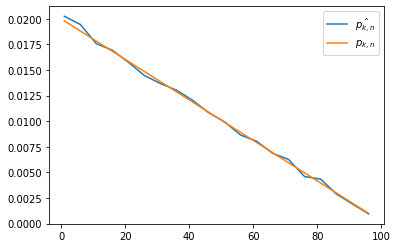

In [5]:
plt.plot(k_array, p_k_n_hat, label = r'$\hat{p_{k,n}}$')
plt.plot(k_array, p_k_n, label = r'$p_{k, n}$')
plt.legend()

3) Calculate the expected length of the answer given by your random QA system. i,e write an expression for $L_n = E[K]$ (It's fine to leave it as a summation).

$$ L_n = \frac{2}{n(n + 1)} \sum_{i = 1} ^n (n-i + 1)$$

4) Plot $\hat{L_n}$ estimated through monte-carlo simulations and $L_n$ for $n = 5, 10, 25, 50, 100, 250$ and $500$.

In [12]:
def L_n(n):
    #implement answer from above
    l_n = 0
    for i in range(1, n + 1):
        l_n += i * p_k_n(i, n)
    return l_n

def monte_carlo_L_n(n, T = int(1e5)):
    #T is the number of times you run experiment
    l = 0
    valid = 0
    for i in range(T):
        while True:
            start = np.random.randint(1,n+1)
            end = np.random.randint(1,n+1)
            if end >= start:
                valid += 1
                l += end - start + 1
            break
    return l/valid


In [13]:
n_array = [5, 10, 25, 50, 100, 250, 500]
l_n_hat = [monte_carlo_L_n(n, T = int(1e5)) for n in n_array]
l_n = [L_n(n) for n in n_array]

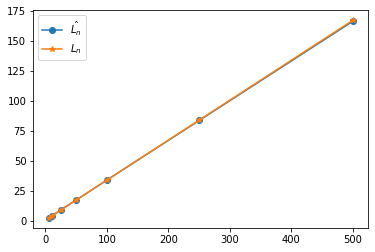

In [14]:
plt.plot(n_array, l_n_hat, '-o', label = r'$\hat{L_n}$')
plt.plot(n_array, l_n,  '-*', label = r'$L_n$')
plt.legend()

5) Calculate the probability, $p_n$ that Random QA system outputs the correct answer to your question. 

$$p_n = \frac{2}{n(n+1)} $$

6)  In SQuAD 2.0 data set, the answer for your question can either lie within the context paragraph or there could be no answer within the given paragraph. Let $\alpha$ represent the fraction of questions for which the answer \textbf{does not} lie within the paragraph.

In [1]:
def estimate_alpha(data_loader):
    neg = 0
    total = 0
    for i, batch in enumerate(data_loader):
        cw_idxs, cc_idxs, qw_idxs, qc_idxs, y1, y2, ids = batch
        neg += sum(y1 == 0).item()
        total += y1.size(-1)    
    return neg/total


In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
import numpy as np
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.optim.lr_scheduler as sched
import torch.utils.data as data

from squad.util import collate_fn, SQuAD
from collections import OrderedDict
from json import dumps
from tqdm import tqdm
from ujson import load as json_load
import pytorch_lightning as pl

from squad import layers, util
import os

DIR = os.getcwd()

In [4]:

train_path = os.path.join(DIR, 'squad/data/train.npz')
train_loader = data.DataLoader(SQuAD(train_path),
                               batch_size=64,
                               shuffle=True,
                               drop_last=True,
                               collate_fn=collate_fn)
dev_path = os.path.join(DIR, 'squad/data/dev.npz')
dev_loader = data.DataLoader(SQuAD(dev_path),
                               batch_size=64,
                               shuffle=True,
                               drop_last=True,
                               collate_fn=collate_fn)
test_path = os.path.join(DIR, 'squad/data/test.npz')
test_loader = data.DataLoader(SQuAD(test_path),
                               batch_size=64,
                               shuffle=True,
                               drop_last=True,
                               collate_fn=collate_fn)

In [5]:
alpha = estimate_alpha(train_loader)

In [6]:
dev = SQuAD(test_path)

In [7]:
## implement random QA model
## load dataset 
## find F1 and EM on Dev Set
def select(n):
    no_ans = np.random.binomial(1, alpha)
    if no_ans:
        y1, y2 = 0, 0
    else:
        while True:
            y1, y2 = np.random.randint(0, n, size = 2)
            if y1 <= y2:
                break 
    return y1, y2 

def evaluate():
    f1, em = 0, 0
    for i, (cw_idxs, cc_idxs, qw_idxs, qc_idxs, y1, y2, ids) in enumerate(dev):
        n = sum(cw_idxs != 0)
        s1, s2 = select(n)
        if s1 == 0 and s2 == 0 and y1 == 0 and y2 == 0:
            f1 += 1
            em += 1
        else:
            pred_ids = cw_idxs[s1:s2+1]
            preds =  " ".join([str(i) for i in pred_ids])
            answer_ids = cw_idxs[y1:y2+1]
            answer = " ".join([str(i) for i in answer_ids])
            f1 += util.compute_f1(answer,preds)
            em += util.compute_em(answer,preds)
    return f1/5951, em/5951


In [8]:
f1_sum, em_sum = 0, 0
for i in range(100):
    f1, em = evaluate()
    f1_sum += f1
    em_sum += em 


In [9]:
print(f1_sum/100, em_sum/100)

0.34992316364266685 0.33165182322298764


##### F1 Score on Dev Set: .3499231636426668
##### EM on Dev Set: 0.33165182322298764

## RNN Based Model

### 2.1.1 Diagram of Baseline

In [1]:
#Reference to
#https://web.stanford.edu/class/cs224n/project/default-final-project-handout.pdf

In [67]:
from IPython.display import Image

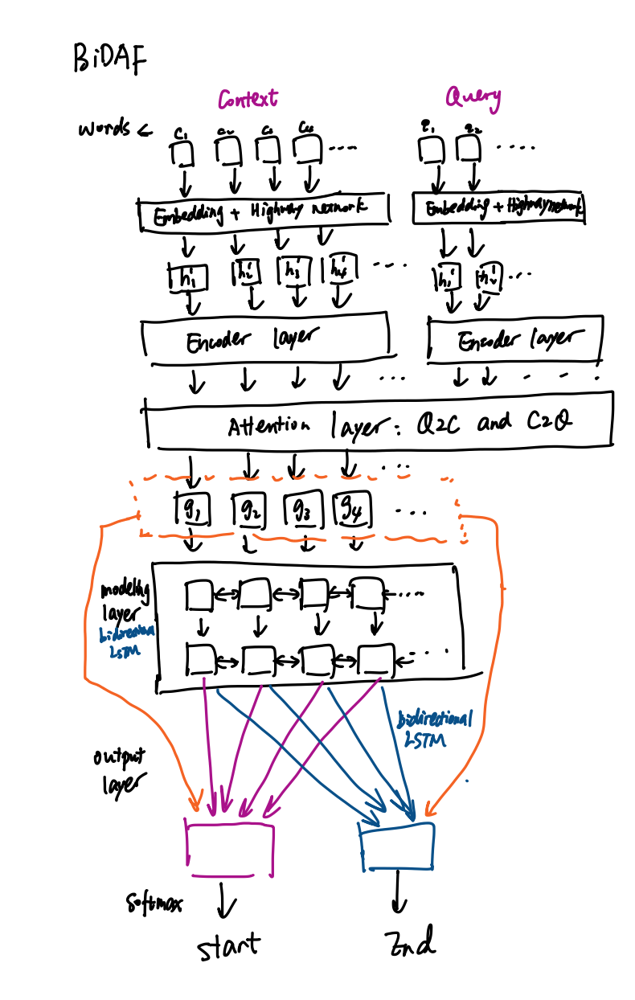

In [68]:
Image('BiDAF.png')

### 2.1.2 Performance of Baseline

In [2]:
! git clone https://github.com/williamFalcon/squad.git

Cloning into 'squad'...
remote: Enumerating objects: 14, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 47 (delta 5), reused 3 (delta 0), pack-reused 33
Unpacking objects: 100% (47/47), done.
Checking connectivity... done.


In [3]:
! cd squad/ && git pull

Already up-to-date.


In [4]:
! ls squad

args.py  environment.yml  LICENSE    README.md	setup.py  train.py
data	 layers.py	  models.py  save	test.py   util.py


In [5]:
! pip install ujson

     |████████████████████████████████| 194kB 3.4MB/s eta 0:00:01
  Created wheel for ujson: filename=ujson-1.35-cp37-cp37m-linux_x86_64.whl size=61929 sha256=f70dea29e6f224db6982371faf850161d2778e584511c59f855a7b6d620ce719
  Stored in directory: /home/long_nyutian/.cache/pip/wheels/28/77/e4/0311145b9c2e2f01470e744855131f9e34d6919687550f87d1
Successfully built ujson


In [6]:
!pip install spacy

     |████████████████████████████████| 10.4MB 3.1MB/s eta 0:00:01
     |████████████████████████████████| 122kB 46.8MB/s eta 0:00:01
     |████████████████████████████████| 194kB 55.7MB/s eta 0:00:01
     |████████████████████████████████| 3.7MB 46.1MB/s eta 0:00:01
     |████████████████████████████████| 2.2MB 44.1MB/s eta 0:00:01


In [7]:
! cd squad/ && python setup.py

glove.840B.300d.zip: 2.18GB [16:58, 2.14MB/s]                                   
Unzipping GloVe word vectors...
     |████████████████████████████████| 12.0MB 1.8MB/s eta 0:00:01    |█████████████████████████       | 9.3MB 1.8MB/s eta 0:00:02
  Created wheel for en-core-web-sm: filename=en_core_web_sm-2.2.5-cp37-none-any.whl size=12011740 sha256=b937a7a013b2e76281e2485a74fb86582209bb9b8ab048a52ac6524c8d68b5e5
  Stored in directory: /tmp/pip-ephem-wheel-cache-di0z5zw7/wheels/6a/47/fb/6b5a0b8906d8e8779246c67d4658fd8a544d4a03a75520197a
Successfully built en-core-web-sm
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/home/long_nyutian/anaconda3/lib/python3.7/site-packages/en_core_web_sm -->
/home/long_nyutian/anaconda3/lib/python3.7/site-packages/spacy/data/en
You can now load the model via spacy.load('en')
Pre-processing train examples...
100%|█████████████████████████████████████████| 442/442 [01:09<00:00,  6.36it/

In [8]:
! pip install tensorboardX

     |████████████████████████████████| 194kB 3.4MB/s eta 0:00:01
     |████████████████████████████████| 1.3MB 51.0MB/s eta 0:00:01


In [9]:
import warnings
warnings.filterwarnings('ignore')

In [13]:
! cd squad/ && python3 train.py -n baseline --batch_size 64 \
    --use_squad_v2 True \
    --num_epochs 20

[12.03.19 03:18:18] Args: {
    "batch_size": 64,
    "char_emb_file": "./data/char_emb.json",
    "dev_eval_file": "./data/dev_eval.json",
    "dev_record_file": "./data/dev.npz",
    "drop_prob": 0.2,
    "ema_decay": 0.999,
    "eval_steps": 50000,
    "gpu_ids": [
        0
    ],
    "hidden_size": 100,
    "l2_wd": 0,
    "load_path": null,
    "lr": 0.5,
    "max_ans_len": 15,
    "max_checkpoints": 5,
    "max_grad_norm": 5.0,
    "maximize_metric": true,
    "metric_name": "F1",
    "name": "baseline",
    "num_epochs": 20,
    "num_visuals": 10,
    "num_workers": 4,
    "save_dir": "./save/train/baseline-01",
    "seed": 224,
    "test_eval_file": "./data/test_eval.json",
    "test_record_file": "./data/test.npz",
    "train_eval_file": "./data/train_eval.json",
    "train_record_file": "./data/train.npz",
    "use_squad_v2": true,
    "word_emb_file": "./data/word_emb.json"
}
[12.03.19 03:18:18] Using random seed 224...
[12.03.19 03:18:18] Loading embeddings...
[12.03.19 03

In [14]:
! cd squad/ && python3 test.py --split dev --load_path save/train/baseline-01/best.pth.tar --name test

[12.03.19 14:04:35] Args: {
    "batch_size": 64,
    "char_emb_file": "./data/char_emb.json",
    "dev_eval_file": "./data/dev_eval.json",
    "dev_record_file": "./data/dev.npz",
    "hidden_size": 100,
    "load_path": "save/train/baseline-01/best.pth.tar",
    "max_ans_len": 15,
    "name": "test",
    "num_visuals": 10,
    "num_workers": 4,
    "save_dir": "./save/test/test-01",
    "split": "dev",
    "sub_file": "submission.csv",
    "test_eval_file": "./data/test_eval.json",
    "test_record_file": "./data/test.npz",
    "train_eval_file": "./data/train_eval.json",
    "train_record_file": "./data/train.npz",
    "use_squad_v2": true,
    "word_emb_file": "./data/word_emb.json"
}
[12.03.19 14:04:35] Loading embeddings...
[12.03.19 14:04:41] Building model...
[12.03.19 14:04:43] Loading checkpoint from save/train/baseline-01/best.pth.tar...
[12.03.19 14:04:43] Building dataset...
[12.03.19 14:04:44] Evaluating on dev split...
100%|████████████████████████████| 5951/5951 [00:10<

In [65]:
!md5sum "./squad/save/train/baseline-01/best.pth.tar"

ca5ddc384f8777239819dcdd9c302563  ./squad/save/train/baseline-01/best.pth.tar


In [14]:
### code to load your model and evaluate on the dev set

### model = 

def evaluate_on_dev_set(model, devloader):
    return f1_score, em_score

##### F1 Score on Dev Set: 60.16
##### EM on Dev Set: 56.83

## Improving the Baseline

Correspoding code and diagrams are in the other notebook named hw5_2.2

### 2.2.1 Diagram of your architecture

### 2.2.2 Performance of your Architecture

##### F1 Score on Dev Set:
##### EM on Dev Set: 

## 3 Fine Tuning Bert

In [69]:
from IPython.display import Image

In [7]:
! git clone https://github.com/huggingface/transformers

Cloning into 'transformers'...
remote: Enumerating objects: 54, done.
remote: Counting objects: 100% (54/54), done.
remote: Compressing objects: 100% (43/43), done.
remote: Total 12983 (delta 27), reused 31 (delta 11), pack-reused 12929
Receiving objects: 100% (12983/12983), 6.72 MiB | 0 bytes/s, done.
Resolving deltas: 100% (9478/9478), done.
Checking connectivity... done.


In [10]:
!cd transformers

In [11]:
!pip install transformers

     |████████████████████████████████| 368kB 3.4MB/s eta 0:00:01
     |████████████████████████████████| 860kB 58.1MB/s eta 0:00:01
     |████████████████████████████████| 675kB 53.8MB/s eta 0:00:01
     |████████████████████████████████| 133kB 54.2MB/s eta 0:00:01
     |████████████████████████████████| 1.0MB 53.8MB/s eta 0:00:01
     |████████████████████████████████| 71kB 38.0MB/s eta 0:00:01
     |████████████████████████████████| 5.7MB 44.7MB/s eta 0:00:01
  Created wheel for sacremoses: filename=sacremoses-0.0.35-cp37-none-any.whl size=883999 sha256=8c4c6dbe5b197ab8beeea72b14b128e97dda46e3f1592555b58829a9f4d111f4
  Stored in directory: /home/zhanglf7788_gmail_com/.cache/pip/wheels/63/2a/db/63e2909042c634ef551d0d9ac825b2b0b32dede4a6d87ddc94
  Created wheel for regex: filename=regex-2019.11.1-cp37-cp37m-linux_x86_64.whl size=608011 sha256=e38e3424b246a36d7e7c5fc091a1e9f2652c8473a68131f843cd16f5aba7b13c
  Stored in directory: /home/zhanglf7788_gmail_com/.cache/pip/wheels/5c/c6/c1/0

In [3]:
!python3 ./transformers/examples/run_squad.py \
    --model_type bert \
    --model_name_or_path bert-large-uncased-whole-word-masking \
    --do_train \
    --do_eval \
    --do_lower_case \
    --train_file ./squad/data/train-v2.0.json \
    --predict_file ./squad/data/dev-v2.0.json \
    --learning_rate 3e-5 \
    --num_train_epochs 2 \
    --max_seq_length 384 \
    --doc_stride 128 \
    --output_dir ./models/wwm_uncased_finetuned_squad/ \
    --per_gpu_eval_batch_size=3  \
    --per_gpu_train_batch_size=3  \
    --version_2_with_negative \
    --save_steps 10000

12/01/2019 04:45:04 - WARNING - __main__ -   Process rank: -1, device: cuda, n_gpu: 1, distributed training: False, 16-bits training: False
12/01/2019 04:45:05 - INFO - transformers.configuration_utils -   loading configuration file https://s3.amazonaws.com/models.huggingface.co/bert/bert-large-uncased-whole-word-masking-config.json from cache at /home/zhanglf7788_gmail_com/.cache/torch/transformers/acdf0fd9c7a1b157516c5c0434216c72438b384fb6ddeeaa20d67e83d1fef81f.4c88e2dec8f8b017f319f6db2b157fee632c0860d9422e4851bd0d6999f9ce38
12/01/2019 04:45:05 - INFO - transformers.configuration_utils -   Model config {
  "attention_probs_dropout_prob": 0.1,
  "finetuning_task": null,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 1024,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "is_decoder": false,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "num_attention_heads": 16,
  "num_hidden_layers": 24,
  "num_labels": 2,
  "output_attentions": fal

In [8]:
!md5sum "models/wwm_uncased_finetuned_squad/pytorch_model.bin"

7ca065a286e2297b3e2f806b22b5062e  models/wwm_uncased_finetuned_squad/pytorch_model.bin


In [17]:
## load your saved model

# evaluate_on_dev_set(your_bert_model, dev_set)

##### F1 Score on Dev Set: 82.23
##### EM on Dev Set:  79.65

## 4 Analysis

Example 1

Example 2

Example 3

In [2]:
#Real
from ujson import load as json_load
with open('squad/data/dev-v2.0.json', 'r') as fp:
        label = json_load(fp)

In [3]:
#BERT
from ujson import load as json_load
with open('models/wwm_uncased_finetuned_squad/predictions_.json', 'r') as fh:
        pred = json_load(fh)


In [6]:
#Baseline
import pandas as pd
pred_baseline=pd.read_csv('dev_submission.csv')

In [7]:
#2.2
pred_m2=pd.read_csv('dev_submission_2.csv')

# Example 1

In [8]:
label['data'][2]['paragraphs'][9]['qas'][4]

{'question': 'What was a non-religious reason for the massacre?',
 'id': '830f368db3dffe4baf4cf9faa',
 'answers': [{'text': 'some of the Huguenots were nobles trying to establish separate centers of power in southern France',
   'answer_start': 349},
  {'text': 'political reasons', 'answer_start': 310},
  {'text': 'some of the Huguenots were nobles trying to establish separate centers of power in southern France',
   'answer_start': 349}],
 'is_impossible': False}

In [9]:
#BERT
pred['830f368db3dffe4baf4cf9faa']

''

In [10]:
#Baseline 
pred_baseline[pred_baseline['Id']=='830f368db3dffe4baf4cf9faa']

,Id,Predicted
2212,830f368db3dffe4baf4cf9faa,NaN


In [11]:
#2.2
pred_m2[pred_m2['Id']=='830f368db3dffe4baf4cf9faa']

,Id,Predicted
2212,830f368db3dffe4baf4cf9faa,NaN


# Example 2

In [12]:
label['data'][2]['paragraphs'][13]['qas'][2]

{'question': 'What was the population of the Dutch Republic before this emigration?',
 'id': '028fba9bb26fcdb32ee8a0a47',
 'answers': [{'text': 'ca. 2 million', 'answer_start': 367},
  {'text': '2 million', 'answer_start': 371},
  {'text': '2 million', 'answer_start': 371}],
 'is_impossible': False}

In [13]:
#BERT
pred['028fba9bb26fcdb32ee8a0a47']

''

In [14]:
#Baseline
pred_baseline[pred_baseline['Id']=='028fba9bb26fcdb32ee8a0a47']

,Id,Predicted
17,028fba9bb26fcdb32ee8a0a47,"75,000 to 100,000"


In [15]:
#2.2
pred_m2[pred_m2['Id']=='028fba9bb26fcdb32ee8a0a47']

,Id,Predicted
17,028fba9bb26fcdb32ee8a0a47,"75,000 to 100,000"


# Example 3

In [16]:
label['data'][2]['paragraphs'][14]['qas'][0]

{'question': 'Where was the Gate of King Hugo?',
 'id': '19ecffc0ed59d90e9ad9f4695',
 'answers': [{'text': 'Tours', 'answer_start': 367},
  {'text': 'Tours', 'answer_start': 367},
  {'text': 'Tours', 'answer_start': 367}],
 'is_impossible': False}

In [17]:
#BERT
pred['19ecffc0ed59d90e9ad9f4695']

'Huguon'

In [18]:
#Baseline 
pred_baseline[pred_baseline['Id']=='19ecffc0ed59d90e9ad9f4695']

,Id,Predicted
407,19ecffc0ed59d90e9ad9f4695,NaN


In [19]:
#2.2
pred_m2[pred_m2['Id']=='19ecffc0ed59d90e9ad9f4695']

,Id,Predicted
407,19ecffc0ed59d90e9ad9f4695,Huguon
